In [1]:
from __future__ import print_function
import sys, os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

import ROOT
%jsroot on
from ROOT import gROOT, gStyle, gDirectory, gPad

from array import array

import constants
import crv_event
import crv_spill
import utils
import geometry
import geometry_constants
import filepath

gROOT.Reset()
gROOT.SetBatch(1)
gROOT.ProcessLine( "gErrorIgnoreLevel = 1001;")
gStyle.SetOptStat(111110)
gStyle.SetOptFit(0)
gStyle.SetLineScalePS(0.3)

TARGET_OVERVOLTAGE = 3 # V
MV_PER_TRIM = -2 # mV/DAC
MV_PER_BULK = 20 # mV/DAC

topdir = os.path.dirname(os.path.abspath("__file__"))
settings_dir = os.path.join(topdir,"settings")

fileList0 = filepath.getfilelist(["bulk_scan_crvaging011_0"],"recoROOT",5)[0]
fileList1 = filepath.getfilelist(["bulk_scan_crvaging011_1"],"recoROOT",5)[0]
fileList2 = filepath.getfilelist([1710,1711,1712,1713,1714],"recoROOT",5)[0]
fileList3 = filepath.getfilelist([1715,1716,1717,1718,1719],"recoROOT",5)[0]
DeltaBulkNorm = filepath.datatag["bulk_scan_crvaging011_0"]["bulk"]

nSmooth = 1 
tdict1 = {'*':[["temperatureCMB[0][0]","temperatureCMB[1][0]","temperatureCMB[2][0]",
                "temperatureCMB[3][0]","temperatureCMB[4][0]","temperatureCMB[5][0]",
                "temperatureCMB[6][0]","temperatureCMB[7][0]"],
               ["temperatureFEB[0:8]"]]}
tdict2 = {'*':[["temperatureCMB[0][8]","temperatureCMB[1][0]","temperatureCMB[2][0]"], # quad counters have not temperature readings 
               ["temperatureFEB[0:3]"]]}
tdict3 = {'*':[["temperatureCMB[0][8]"], # quad counters have not temperature readings 
               ["temperatureFEB[0]"]]}


Welcome to JupyROOT 6.28/04


Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001694_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001695_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001696_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001697_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001698_000.root


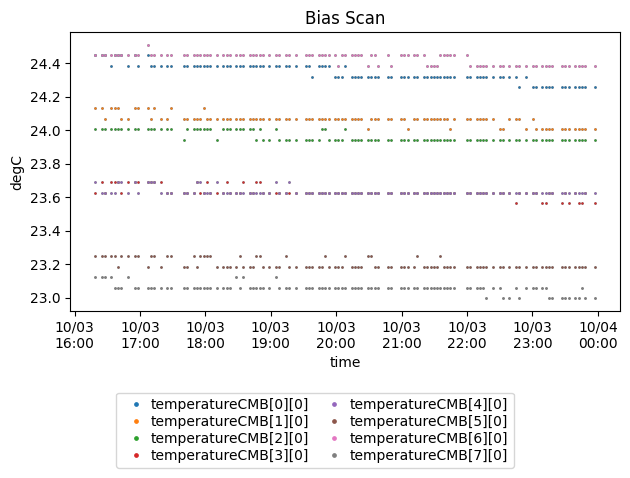

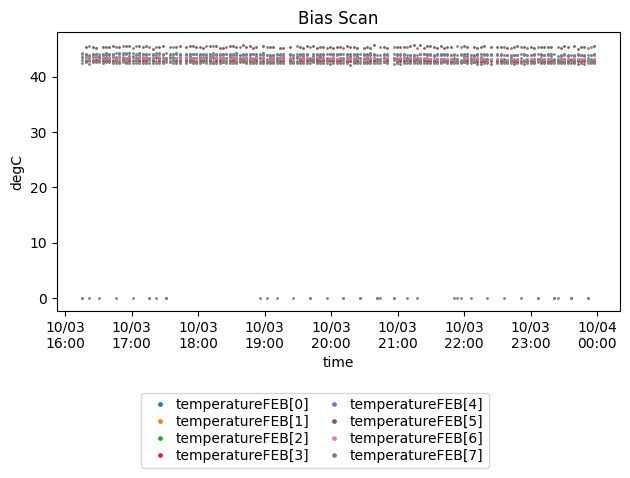

In [2]:
tfig = utils.plot_dqm(fileList0, tdict1, '& 0xfffffffffffffe == 0x0', False, nSmooth, True, "Bias Scan;time;degC") 

Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001700_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001701_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001702_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001703_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001704_000.root


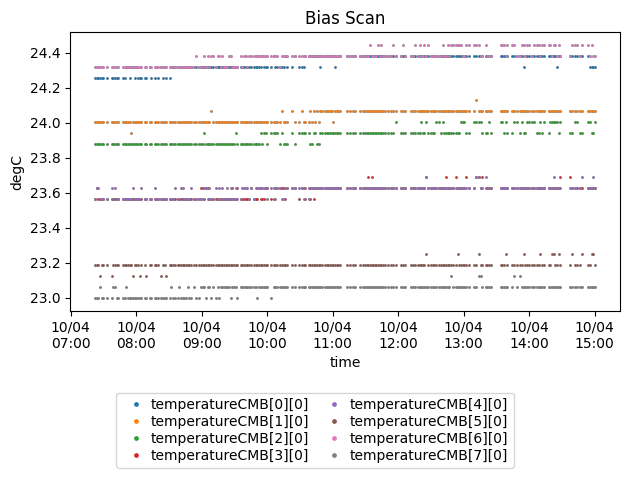

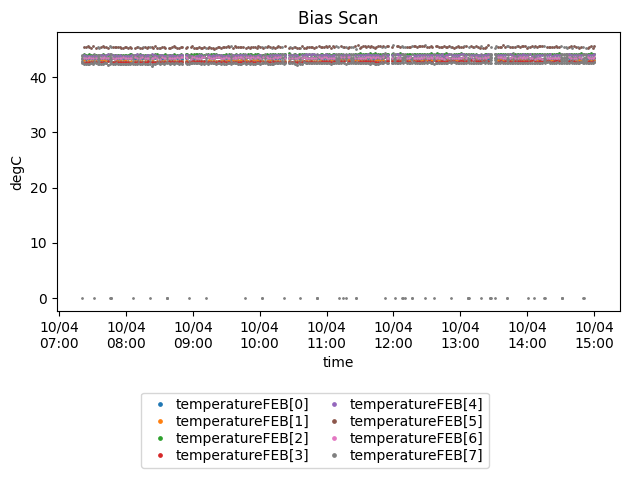

In [3]:
tfig = utils.plot_dqm(fileList1, tdict1, '==0x0', False, nSmooth, True, "Bias Scan;time;degC") 

Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001710_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001711_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001712_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001713_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001714_000.root


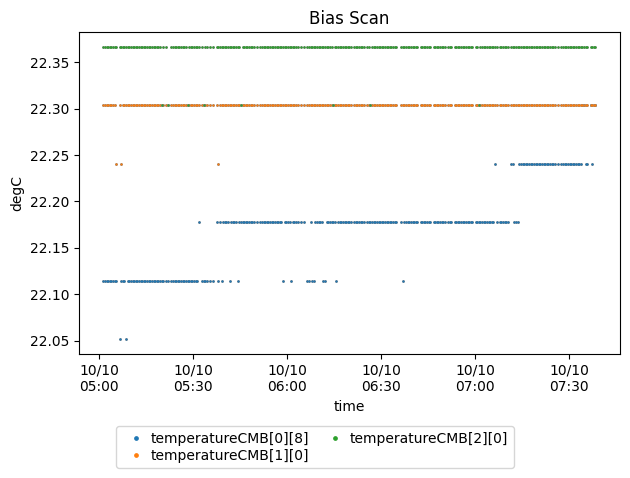

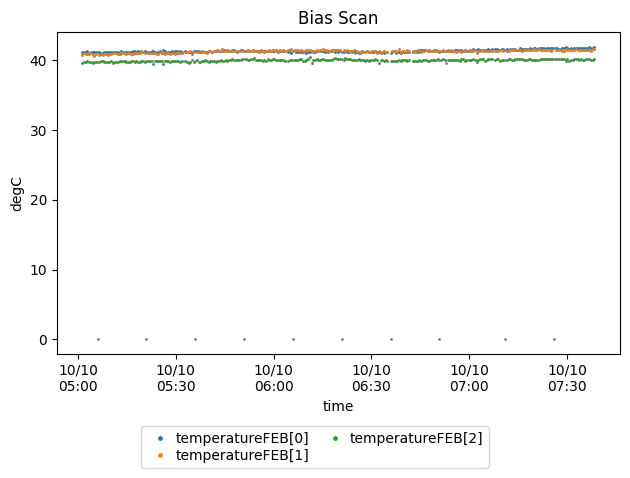

In [4]:
tfig = utils.plot_dqm(fileList2, tdict2, '& 0xfffffffffffffe == 0x0', False, nSmooth, True, "Bias Scan;time;degC") # run 1713 skipped spill number 12 

Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001715_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001716_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001717_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001718_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001719_000.root


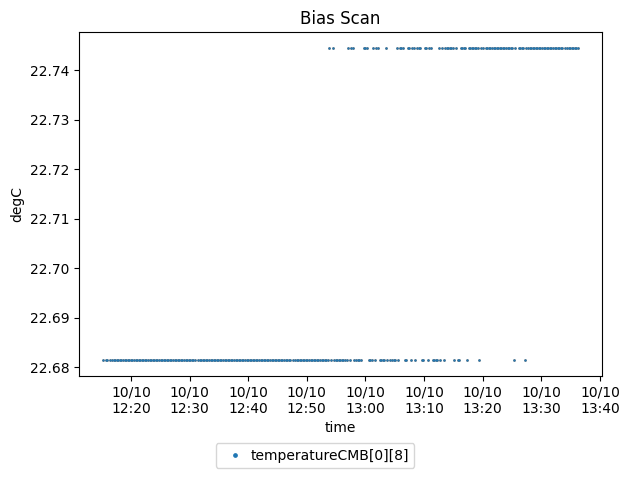

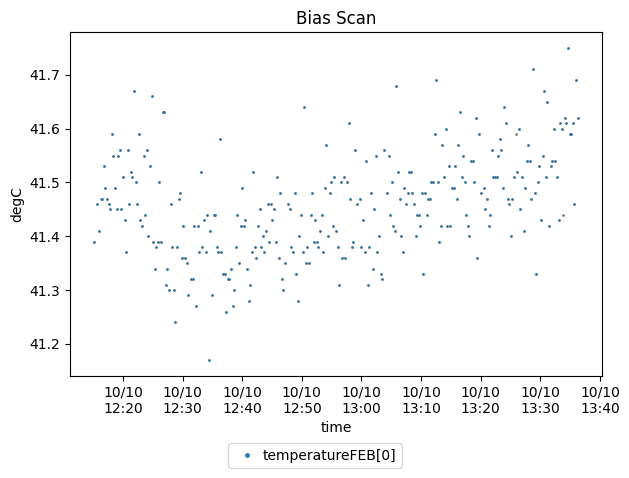

In [5]:
tfig = utils.plot_dqm(fileList3, tdict3, '& 0xfffffffffffffe == 0x0', False, nSmooth, True, "Bias Scan;time;degC")  # run 1717 skipped spill number 44

In [6]:
import pandas as pd
from scipy import stats
import settings_file

def PortToDF(fileList, bulkList):
    df = pd.DataFrame()

    for index, filename in enumerate(fileList):
        runNum = filepath.filenameparser(filename, 'run') 
        subrunNum = filepath.filenameparser(filename, 'subrun') 

        fFile = ROOT.TFile(filename, "READ")
        runSummarytree = fFile.Get("runSummary")
        spilltree = fFile.Get("spills")
        spilltree.GetEntry(0)
        nFEB = spilltree.spill_number_of_febs
        runSummarytree.GetEntry(0)
        
        pedestal = np.reshape(np.array(runSummarytree.pedestals, dtype=np.float32), (nFEB, geometry_constants.nChannelPerFEB))
        calibRaw = np.reshape(np.array(runSummarytree.calibConstants, dtype=np.float32), (nFEB, geometry_constants.nChannelPerFEB))
        calibAdj = np.reshape(np.array(runSummarytree.calibConstantsTemperatureCorrected, dtype=np.float32), (nFEB, geometry_constants.nChannelPerFEB))
        FEBtemp = np.array(runSummarytree.febTemperaturesAvg, dtype=np.float32)
        CMBtemp = np.reshape(np.array(runSummarytree.meanTemperatures, dtype=np.float32), (nFEB, geometry_constants.nChannelPerFEB))
        biasV = np.reshape(np.array(runSummarytree.biasVoltagesAvg, dtype=np.float32), (nFEB, int(geometry_constants.nChannelPerFEB/8)))
        # PEs = np.reshape(np.array(runSummarytree.PEs, dtype=np.float32), (nFEB, geometry_constants.nChannelPerFEB))
        # PEsCorrected = np.reshape(np.array(runSummarytree.PEsTemperatureCorrected, dtype=np.float32), (nFEB, geometry_constants.nChannelPerFEB))
        
        for iFEB in range(nFEB):
            for iCh in range(geometry_constants.nChannelPerFEB):
                df_ = pd.DataFrame()
                df_['run'] = [runNum]
                df_['subrun'] = [subrunNum]
                df_['bulkRelative'] = [bulkList[index]]
                df_['FEB'] = [iFEB]
                df_['ch'] = [iCh]
                df_['pedestal'] = [pedestal[iFEB][iCh]]
                df_['calibRaw'] = [calibRaw[iFEB][iCh]]
                df_['calibAdj'] = [calibAdj[iFEB][iCh]]
                df_['FEBtemp'] = [FEBtemp[iFEB] if nFEB>1 else FEBtemp]
                df_['CMBtemp'] = [CMBtemp[iFEB][iCh]]
                df_['biasV'] = [biasV[iFEB][int(iCh/8)]]
                # df_['PEs'] = [PEs[iFEB][iCh]]
                # df_['PEsCorrected'] = [PEsCorrected[iFEB][iCh]]
                
                df = pd.concat([df,df_], ignore_index=True)

        fFile.Close()

    return df

def CalibrateByScan(df0, targetVover = TARGET_OVERVOLTAGE, nr = 4, nc = 4, ifDrawCorr = True): # also compares results from PE
    FEBs = df0['FEB'].unique()
    FEBs = np.sort(FEBs)

    targetBulkOver = targetVover * 1000. / 20.

    df_calib = pd.DataFrame()

    maintitle = "calibration"
    xtitle = "Relative Bulk Settings [DAC unit]"
    ytitle = "SPE [ADC*ns/PE]"
     
    for FEB in FEBs:
        fig, axs = plt.subplots(nrows=nr, ncols=nc, figsize=(5*nc, 5*nr), sharey=True)
        plt.subplots_adjust(wspace=0)
        fig.subplots_adjust(top=0.24*nr/(0.04+0.24*nr))
        plt.suptitle(maintitle + ", FEB "+ str(FEB))
    
        for hdmi, ax in enumerate(axs.flatten()):
            ax.set_xlabel(xtitle)
            if(hdmi%4 == 0):
                ax.set_ylabel(ytitle)
            for inhdmi_chan in range(4):
                chan = hdmi*4+inhdmi_chan

                df0_ = df0.query("FEB==%i & ch==%i"%(FEB, chan)).reset_index()
                # display(df0_)
                x = df0_['bulkRelative']
                y1 = df0_['calibRaw']
                y2 = df0_['calibAdj']

                mask11 = ~np.isnan(y1) 
                mask12 = (y1!=0)
                mask1 = mask11 & mask12
                x1 = x[mask1]
                y1 = y1[mask1]

                if ifDrawCorr:
                    mask21 = ~np.isnan(y2) 
                    mask22 = (y2!=0)
                    mask2 = mask21 & mask22
                    x2 = x[mask2]
                    y2 = y2[mask2]

                bulkRelativeSetting1 = np.nan
                yref1 = np.nan
                bulkRelativeSetting2 = np.nan
                yref2 = np.nan

                if x1 is not None:
                    slope1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(x1.astype(float), y1.astype(float))
                    xintercept1 = - intercept1 / slope1
                    bulkRelativeSetting1 = round(xintercept1 + targetBulkOver, 1)
                    yref1 = bulkRelativeSetting1 * slope1 + intercept1
                
                    markers1 = ax.plot(x1, y1, 'o', label='Chan: %d raw, y = %.1f + %.1f * x, (%.1f, %.1f)'%(chan, intercept1, slope1, bulkRelativeSetting1, yref1))
                    ax.plot(x1, slope1 * x1 + intercept1, '--', color = markers1[0].get_color(), linewidth=0.7)
                
                if ifDrawCorr and len(x2) > 0:
                    slope2, intercept2, r_value2, p_value2, std_err2 = stats.linregress(x2.astype(float), y2.astype(float))
                    xintercept2 = - intercept2 / slope2
                    bulkRelativeSetting2 = round(xintercept2 + targetBulkOver, 1)
                    yref2 = bulkRelativeSetting2 * slope2 + intercept2

                    markers2 = ax.plot(x2, y2, 'v', label='Chan: %d corr., y = %.1f + %.1f * x, (%.1f, %.1f)'%(chan, intercept2, slope2, bulkRelativeSetting2, yref2), color = markers1[0].get_color())
                    ax.plot(x2, slope2 * x2 + intercept2, ':', color = markers1[0].get_color(), linewidth=0.7)

                ax.legend(fontsize='small')

                df_calib_ = pd.DataFrame()
                df_calib_['FEB'] = [FEB]
                df_calib_['ch'] = [chan]
                df_calib_['bulkRelativeSettingRaw'] = [bulkRelativeSetting1]
                df_calib_['SPErefRaw'] = [yref1]
                if ifDrawCorr:
                    df_calib_['bulkRelativeSettingCorr'] = [bulkRelativeSetting2]
                    df_calib_['SPErefCorr'] = [yref2]
                
                df_calib = pd.concat([df_calib,df_calib_], ignore_index=True)

    return df_calib   

In [7]:
def UpdateSettings(originalSettingsFiles, outputSettingsFiles, df_calib, useCorr = True, AFEmask = 0xff):
    FEBs = df_calib['FEB'].unique()
    FEBs = np.sort(FEBs)

    for FEB in FEBs:
        print("FEB%i"%FEB)
        myFilename = os.path.join(settings_dir, originalSettingsFiles[FEB])
        mySettings = settings_file.settingsFile(myFilename)
        print("before change")
        mySettings.Print()
        for chan in range(64):
            df_calib_ = df_calib.query("FEB==%i & ch==%i"%(FEB, chan)).reset_index()
            # display(df_calib_)
            if df_calib_ is not None and len(df_calib_.index)>0:
                adjustment = df_calib_['bulkRelativeSettingCorr'][0] if useCorr else df_calib_['bulkRelativeSettingRaw'][0]
                mySettings.trims[chan] += int(adjustment * MV_PER_BULK / MV_PER_TRIM)
        mySettings.BalanceBiasTrimBulk()
        print("after change")
        mySettings.Print()
        if outputSettingsFiles != None:
            mySettings.DumpToTxt(os.path.join(settings_dir, outputSettingsFiles[FEB]))
        else:
            mySettings.DumpToTxt(None, AFEmask)
    return

,FEB,ch,bulkRelativeSettingRaw,SPErefRaw,bulkRelativeSettingCorr,SPErefCorr
0,0,0,4.4,391.927705,-9.5,388.625311
1,0,1,3.7,394.534154,-8.5,394.330985
2,0,2,2.8,397.274320,-9.8,396.131975
3,0,3,1.8,395.185077,-11.2,393.330632
4,0,4,3.6,381.992729,-10.1,380.132147
...,...,...,...,...,...,...
507,7,59,34.8,411.941540,25.7,411.888729
508,7,60,26.7,401.101468,15.7,397.847579
509,7,61,28.4,407.880220,18.6,406.635551
510,7,62,27.2,407.318561,17.5,406.226524


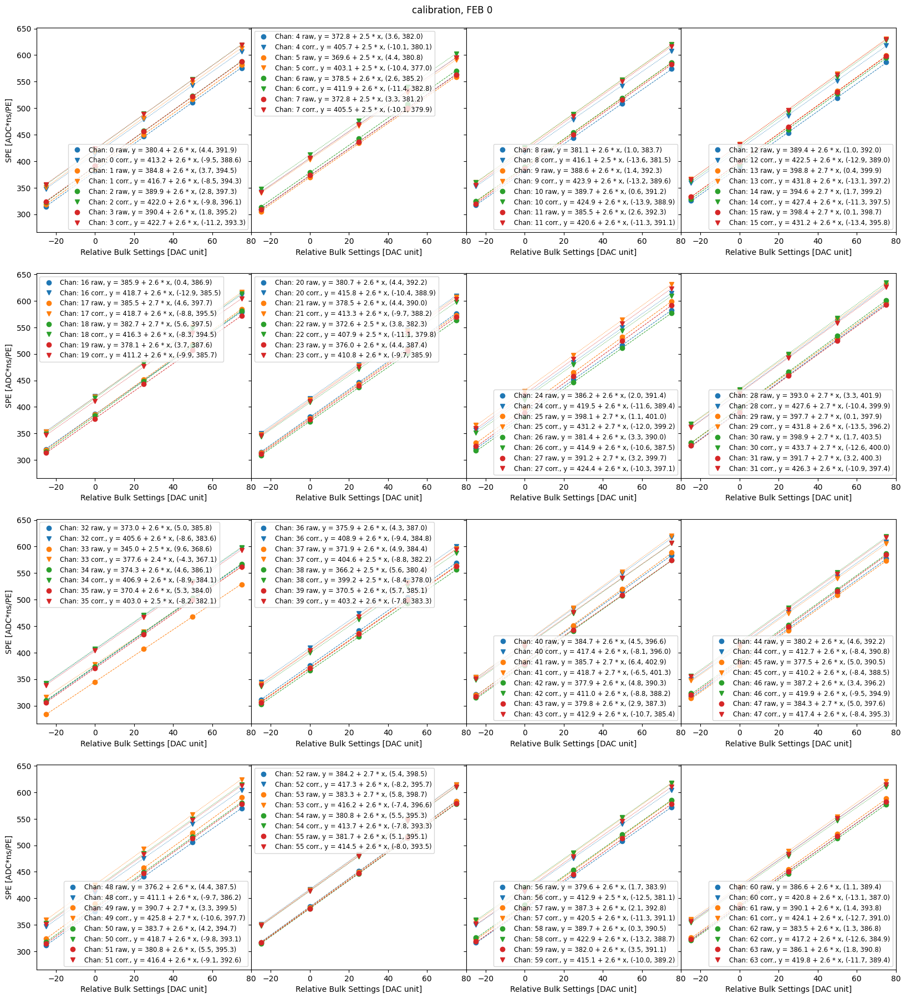

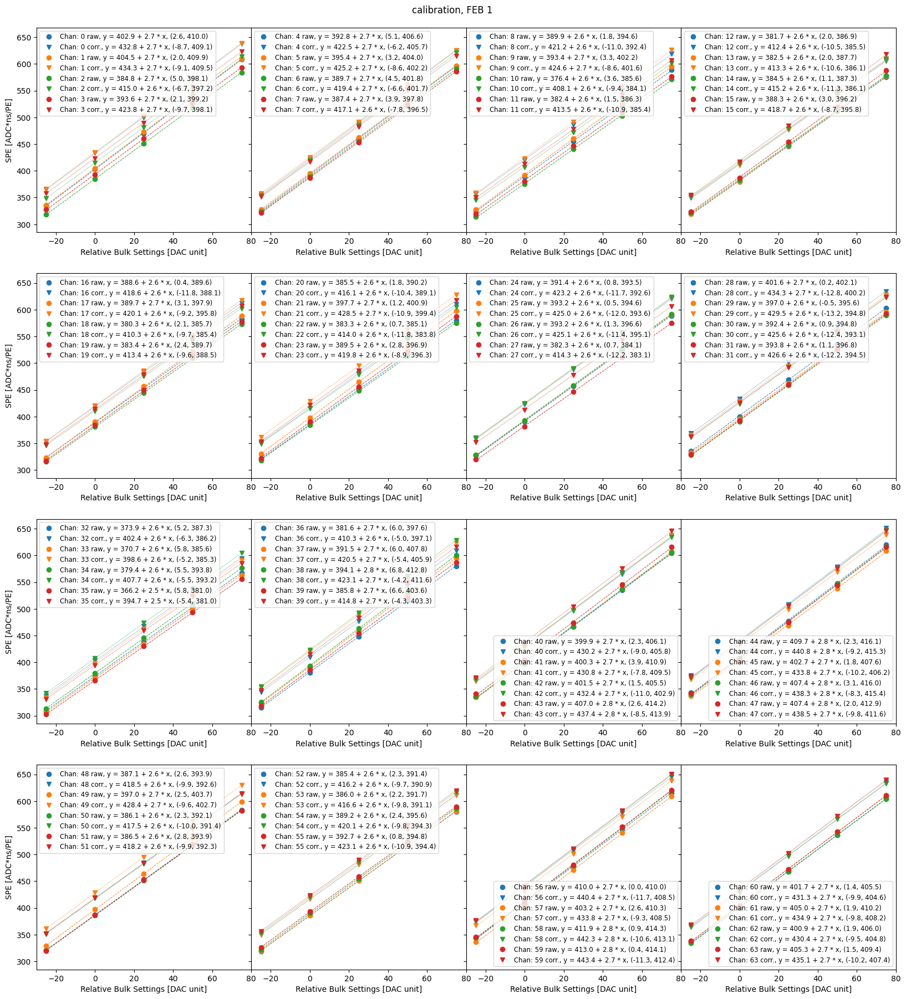

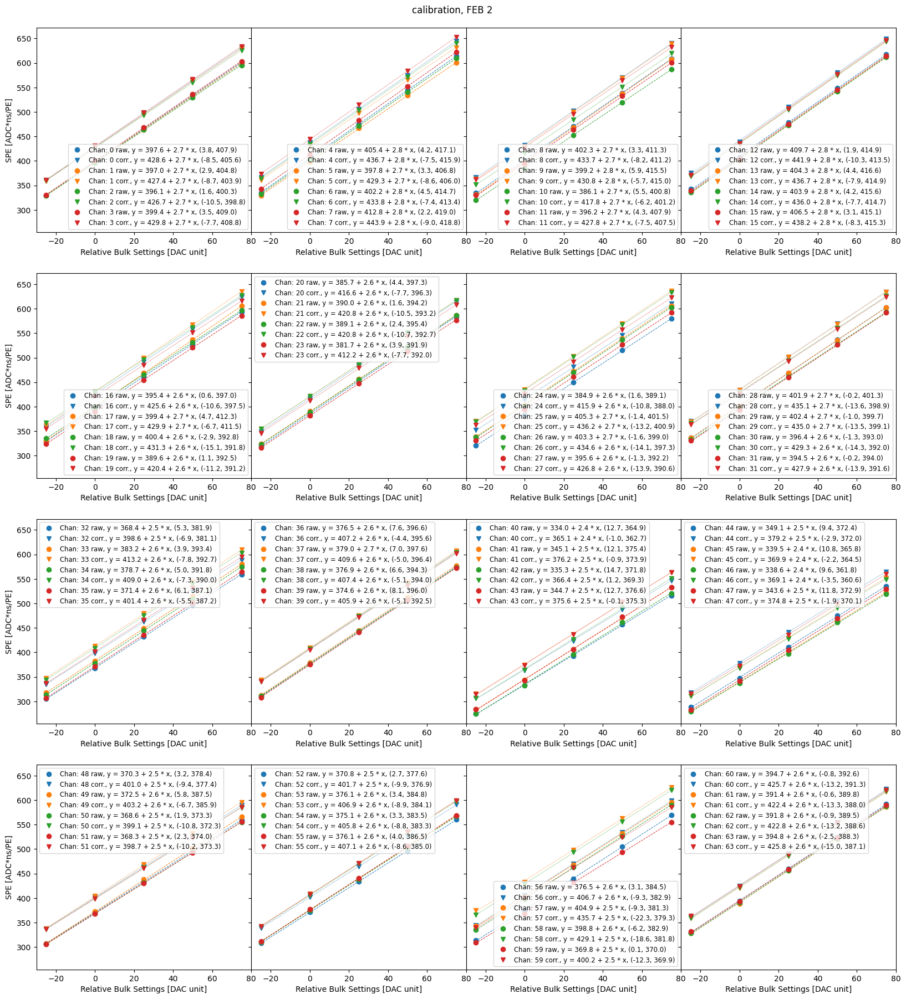

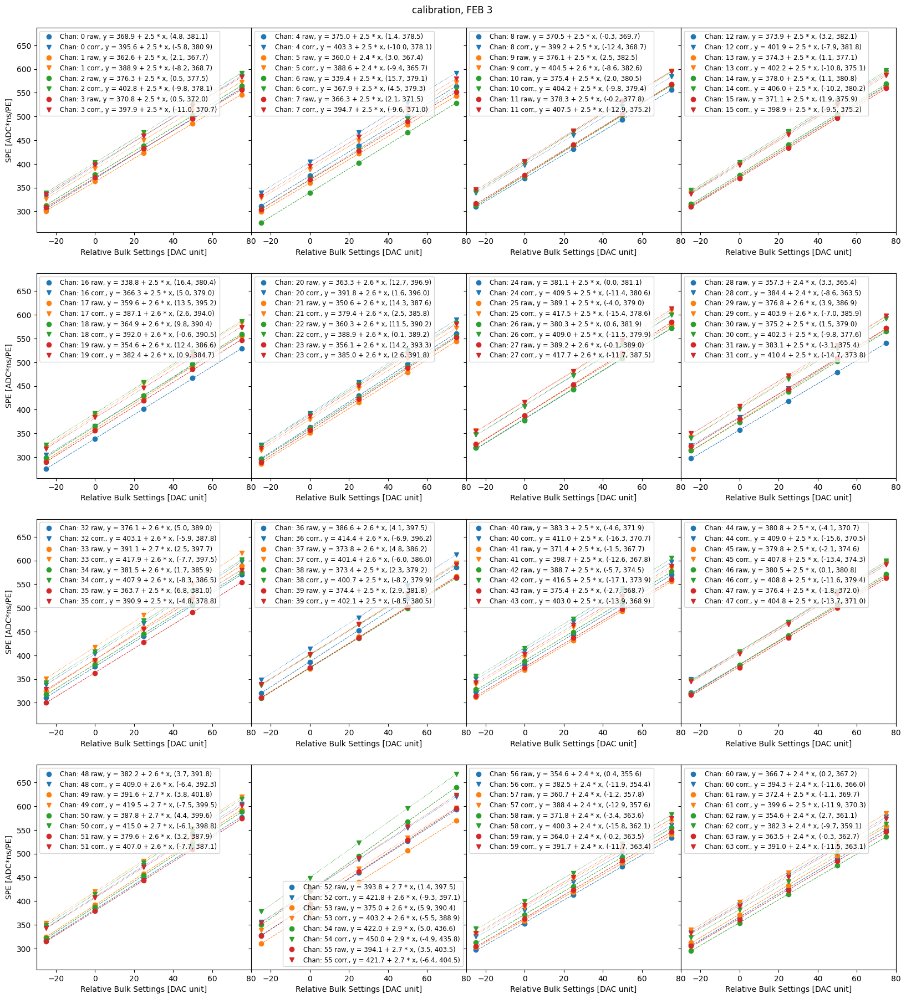

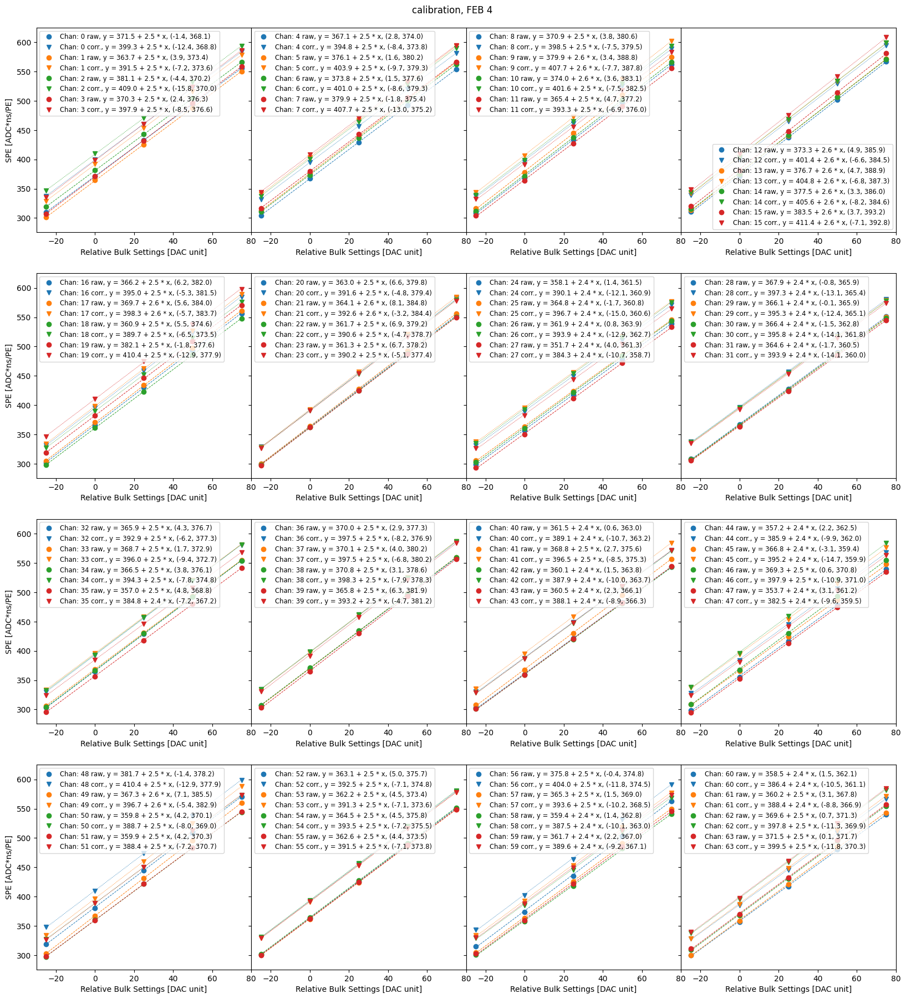

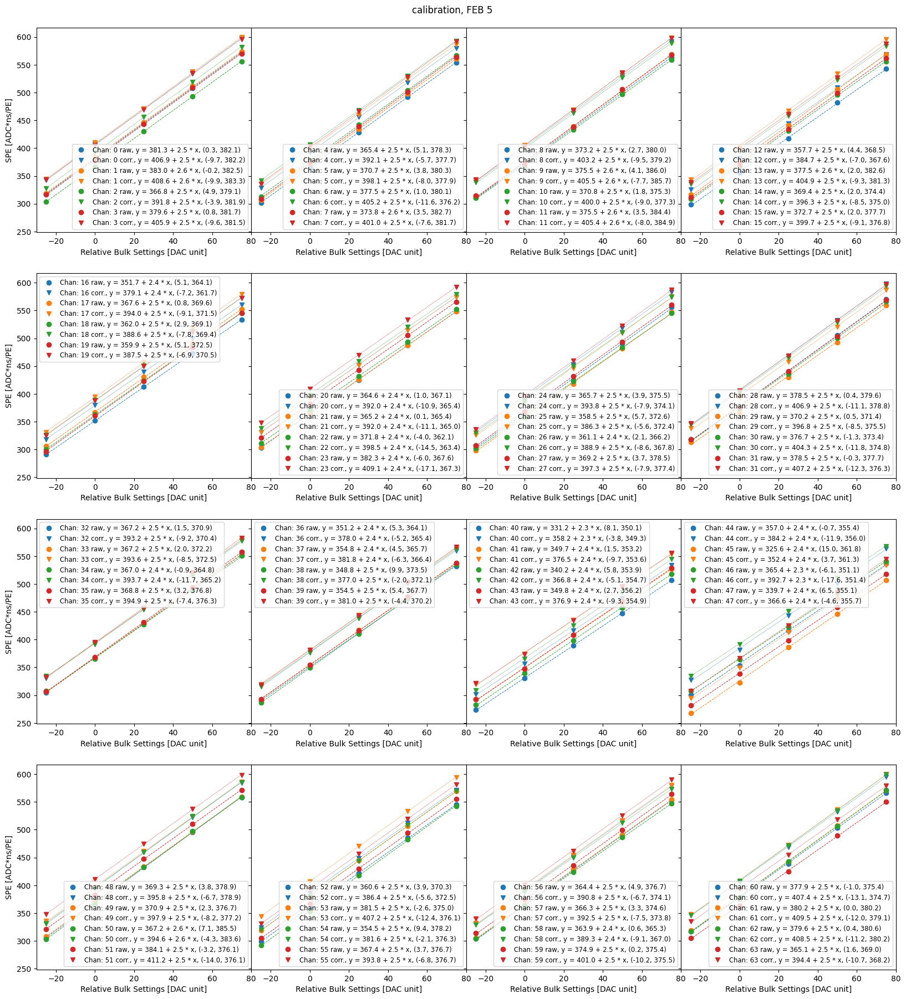

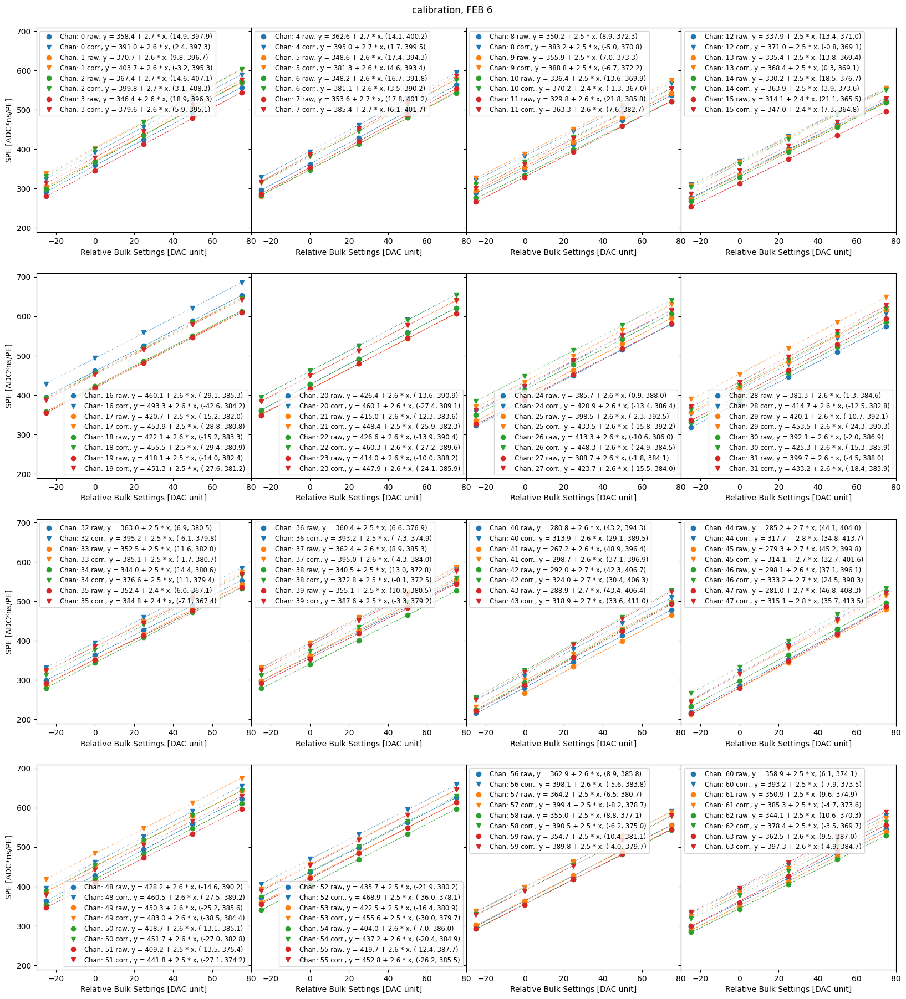

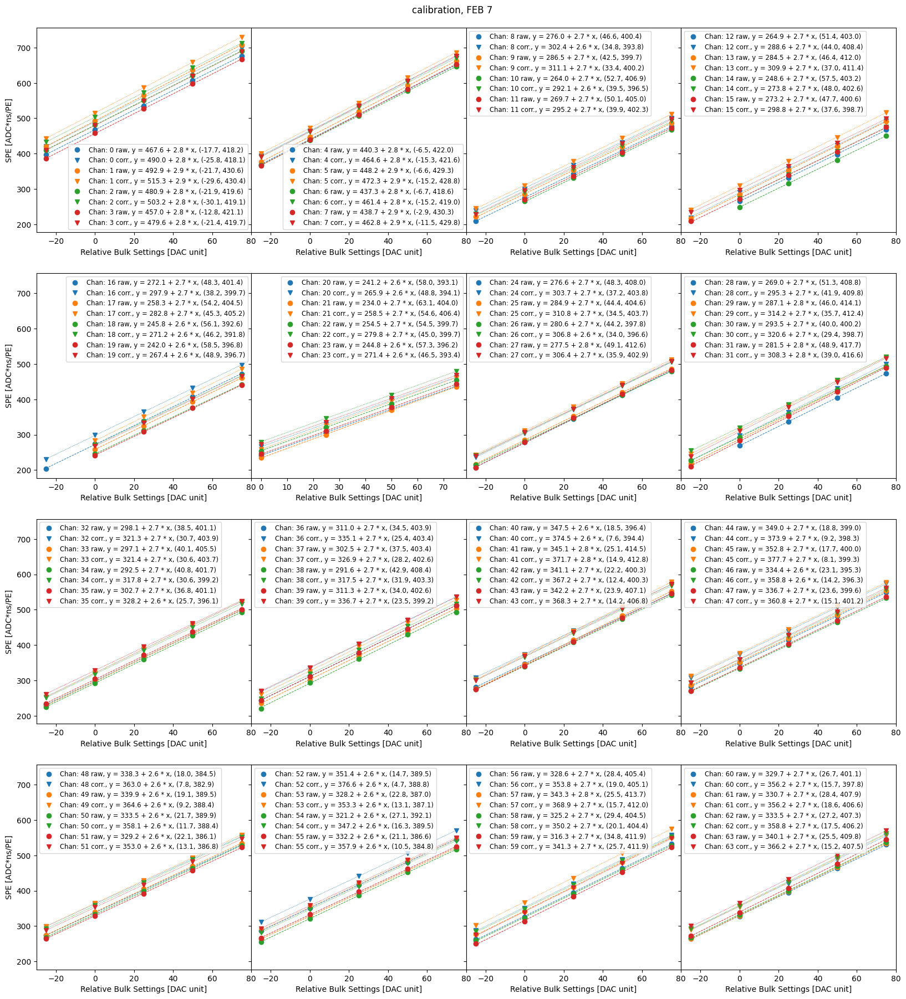

In [8]:
df0 = PortToDF(fileList0, filepath.datatag["bulk_scan_crvaging011_0"]["bulk"])
df_calib0 = CalibrateByScan(df0)
display(df_calib0)

,FEB,ch,bulkRelativeSettingRaw,SPErefRaw,bulkRelativeSettingCorr,SPErefCorr
0,0,0,1.6,385.448620,-10.5,386.319649
1,0,1,2.5,392.165512,-9.6,392.578067
2,0,2,1.6,394.334698,-10.2,395.290792
3,0,3,0.8,392.611233,-10.5,394.529521
4,0,4,1.8,377.925438,-10.6,379.146409
...,...,...,...,...,...,...
507,7,59,34.8,411.583668,26.4,413.522670
508,7,60,26.5,400.325686,16.6,399.430261
509,7,61,27.3,404.410763,18.2,405.204278
510,7,62,26.7,405.710281,17.4,405.942659


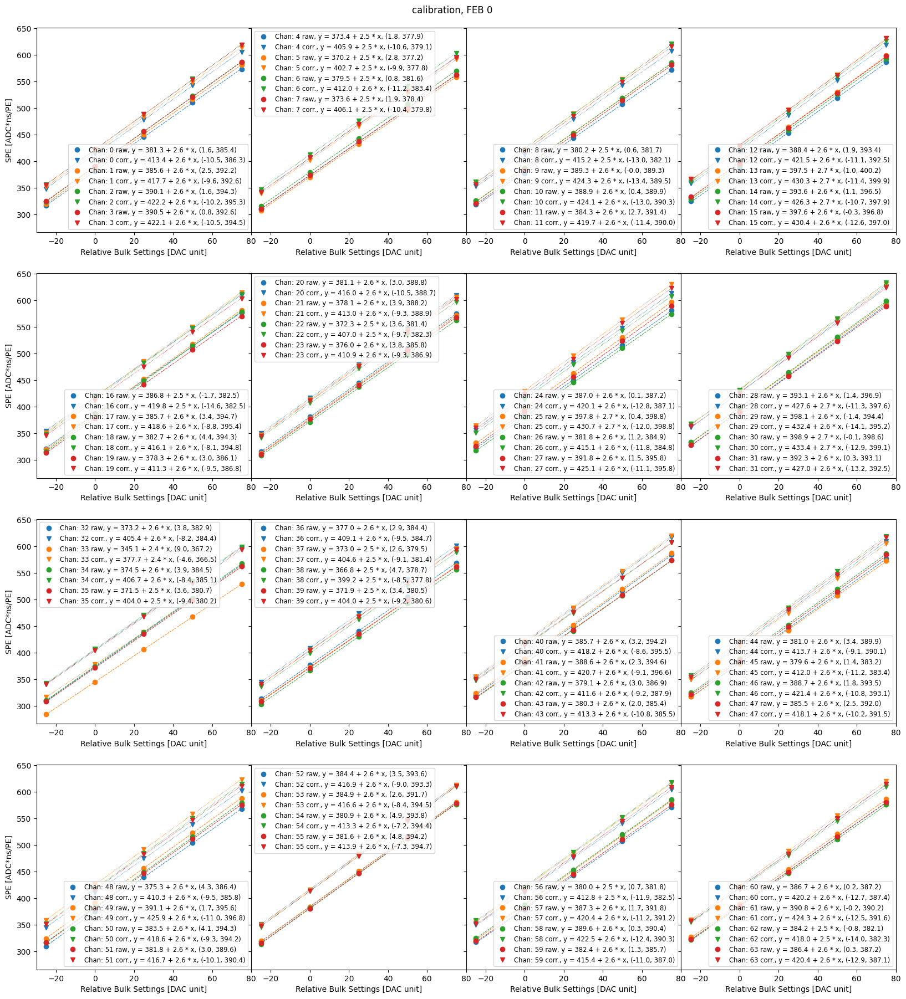

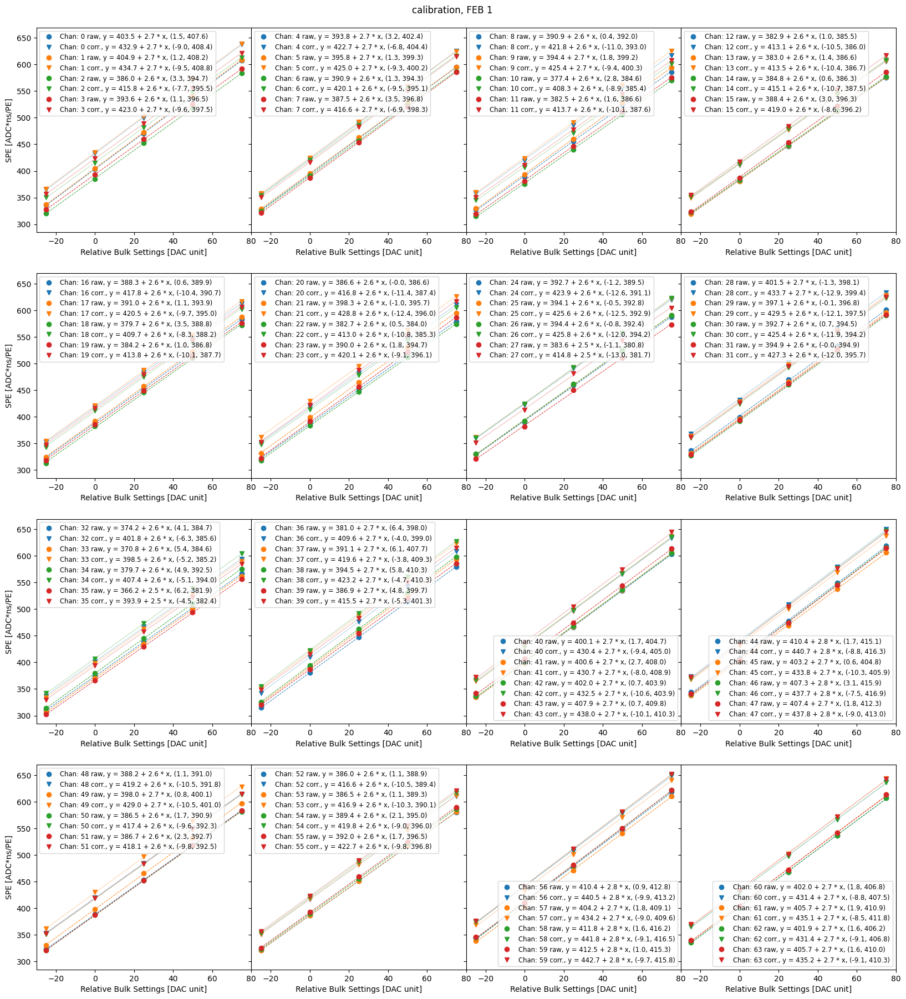

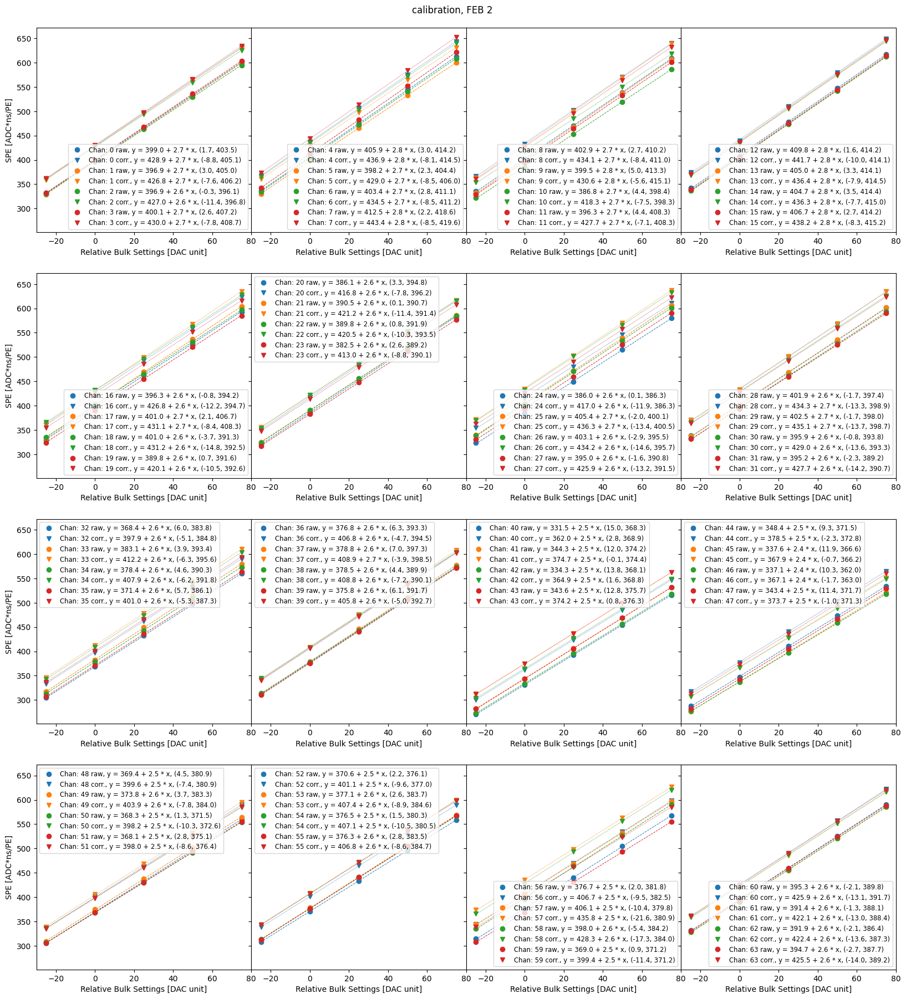

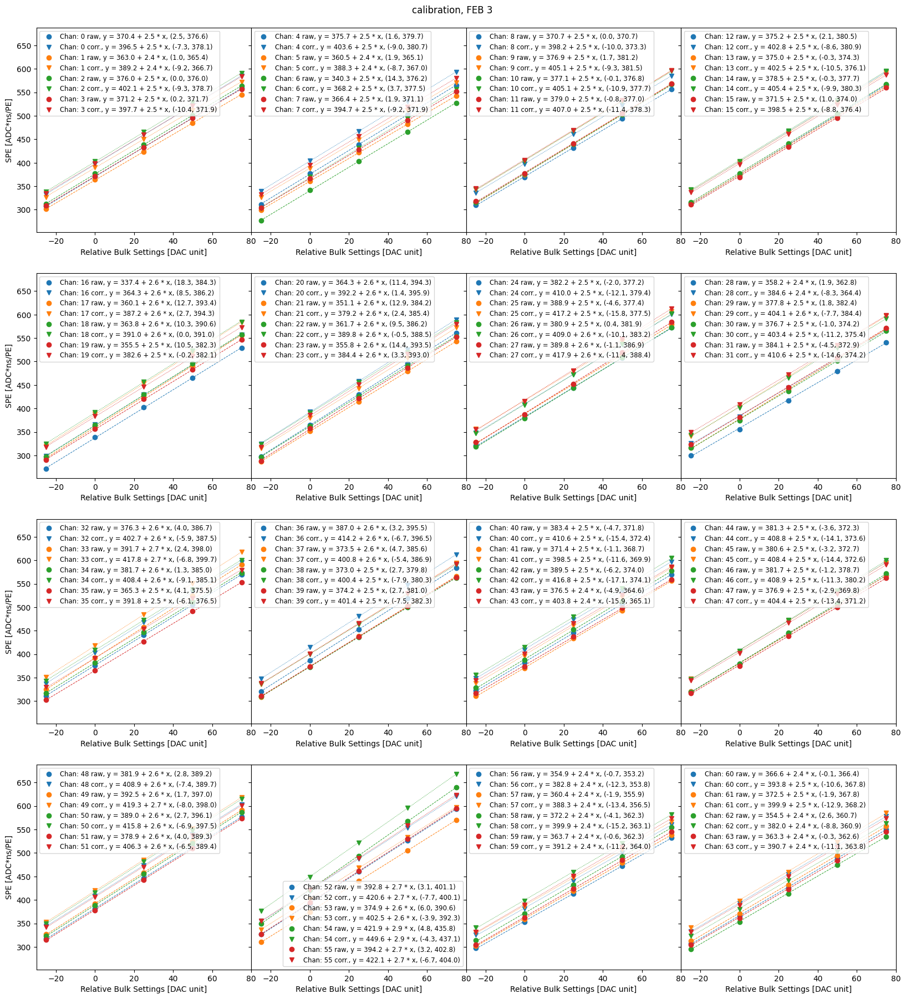

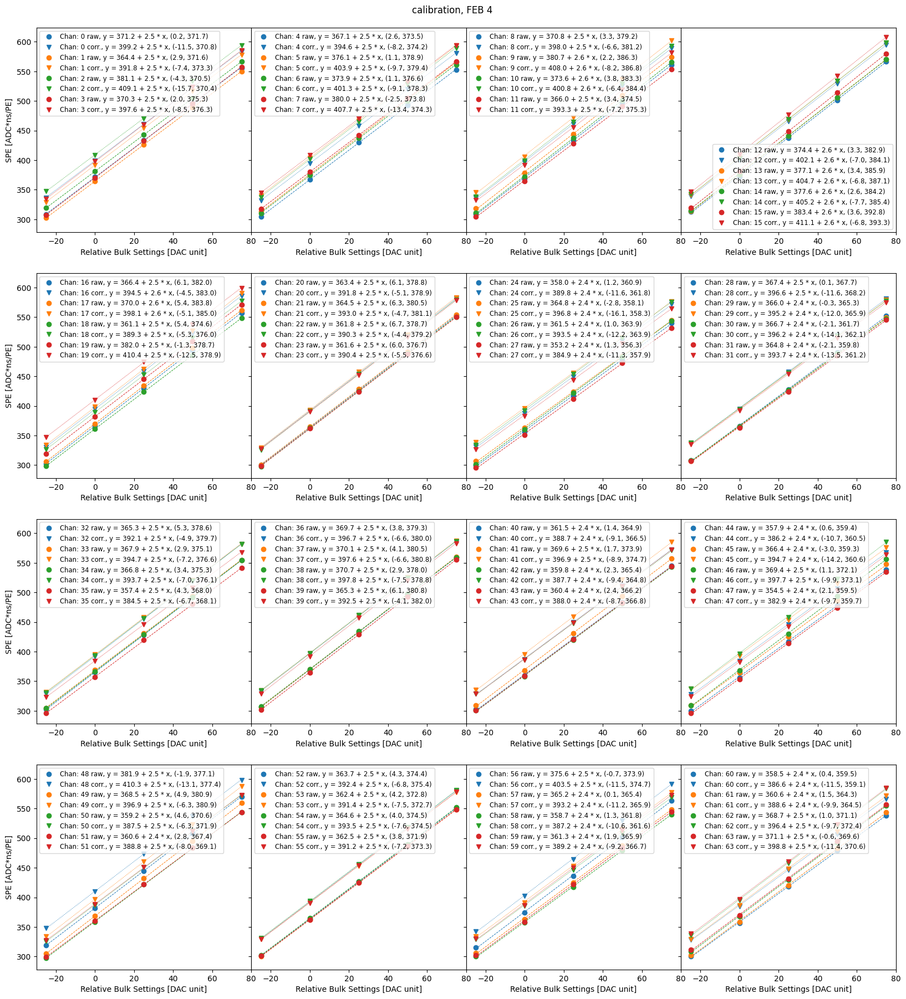

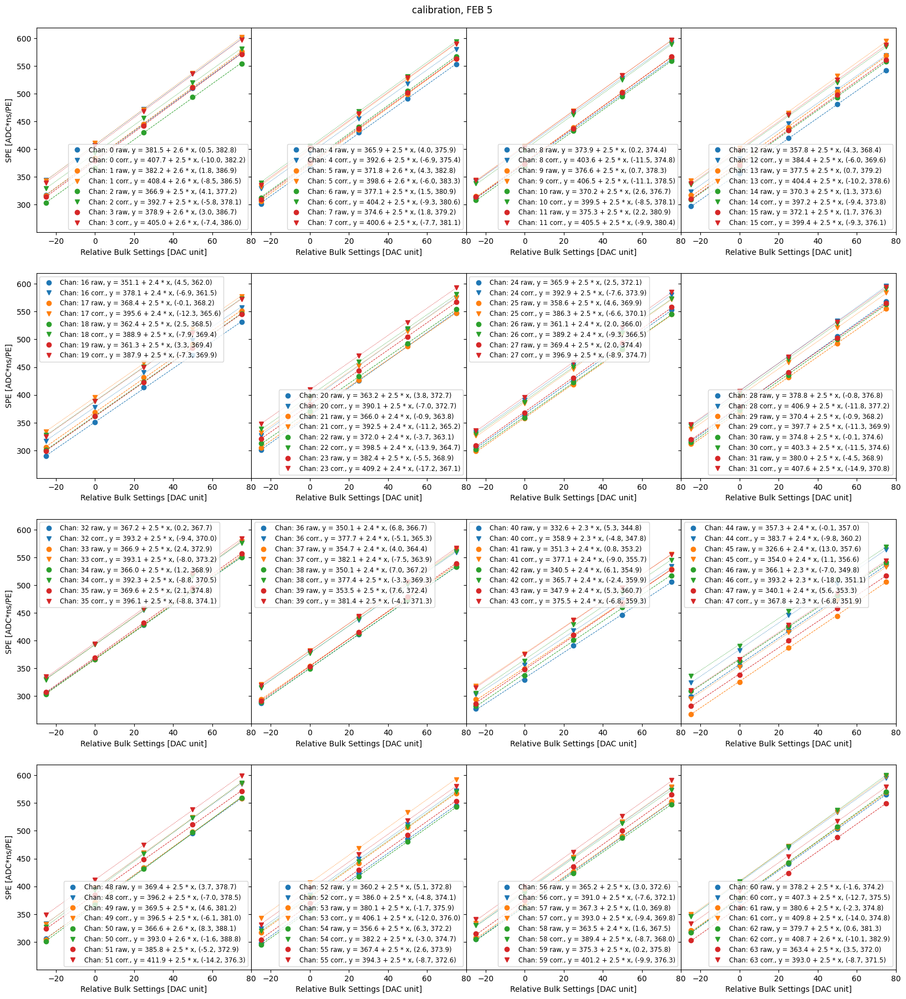

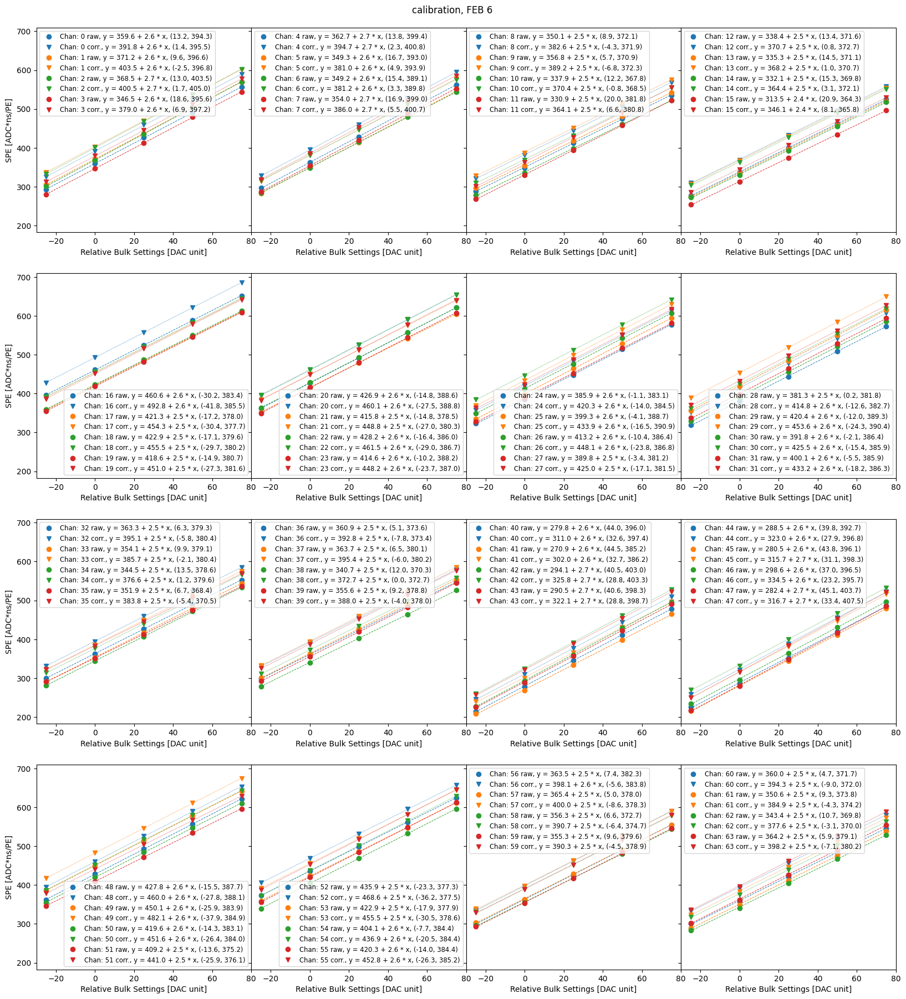

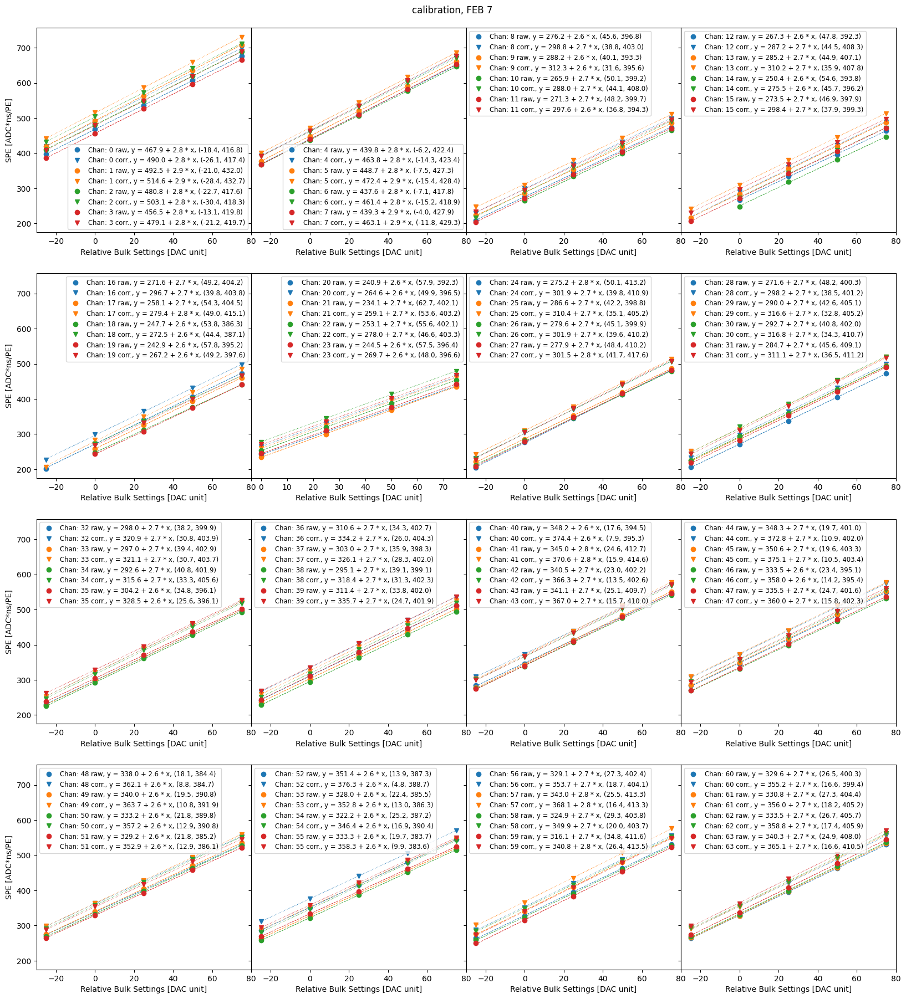

In [9]:
df1 = PortToDF(fileList1, filepath.datatag["bulk_scan_crvaging011_1"]["bulk"])
df_calib1 = CalibrateByScan(df1)
display(df_calib1)

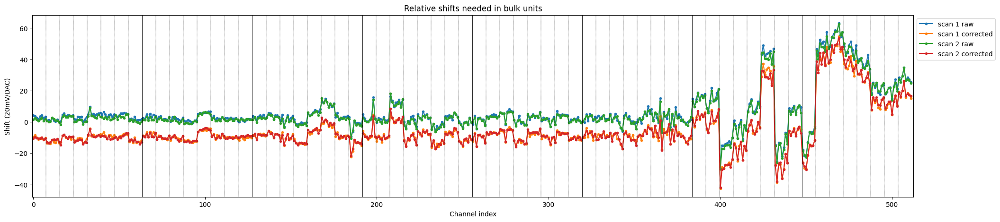

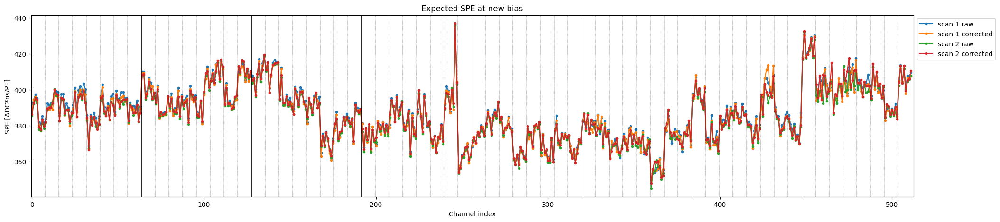

In [10]:
# check consistency
plt.figure(figsize = (24,5))
plt.plot(np.add(df_calib0['FEB']*64,df_calib0['ch']), df_calib0['bulkRelativeSettingRaw'], '.-', label=('scan 1 raw'))
plt.plot(np.add(df_calib0['FEB']*64,df_calib0['ch']), df_calib0['bulkRelativeSettingCorr'], '.-', label=('scan 1 corrected'))
plt.plot(np.add(df_calib1['FEB']*64,df_calib1['ch']), df_calib1['bulkRelativeSettingRaw'], '.-', label=('scan 2 raw'))
plt.plot(np.add(df_calib1['FEB']*64,df_calib1['ch']), df_calib1['bulkRelativeSettingCorr'], '.-', label=('scan 2 corrected'))
plt.title("Relative shifts needed in bulk units")
plt.xlabel("Channel index")
plt.ylabel("Shift (20mV/DAC)")
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
for iFEB in range(8):
    for iAFE in range(8):
        plt.axvline(x=8*(iFEB*8+iAFE)-0.5, color='k', linestyle='-'if iAFE==0 else '--', linewidth=0.6 if iAFE==0 else 0.3)
plt.gca().set_xlim(-0.5, 8*64+0.5)
plt.show()

plt.figure(figsize = (24,5))
plt.plot(np.add(df_calib0['FEB']*64,df_calib0['ch']), df_calib0['SPErefRaw'], '.-', label=('scan 1 raw'))
plt.plot(np.add(df_calib0['FEB']*64,df_calib0['ch']), df_calib0['SPErefCorr'], '.-', label=('scan 1 corrected'))
plt.plot(np.add(df_calib1['FEB']*64,df_calib1['ch']), df_calib1['SPErefRaw'], '.-', label=('scan 2 raw'))
plt.plot(np.add(df_calib1['FEB']*64,df_calib1['ch']), df_calib1['SPErefCorr'], '.-', label=('scan 2 corrected'))
plt.title("Expected SPE at new bias")
plt.xlabel("Channel index")
plt.ylabel("SPE [ADC*ns/PE]")
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
for iFEB in range(8):
    for iAFE in range(8):
        plt.axvline(x=8*(iFEB*8+iAFE)-0.5, color='k', linestyle='-'if iAFE==0 else '--', linewidth=0.6 if iAFE==0 else 0.3)
plt.gca().set_xlim(-0.5, 8*64+0.5)
plt.show()

In [11]:
initial_settings_files = ["Settings_crvaging-008_FEB0_sync402.txt",
                          "Settings_crvaging-008_FEB1_sync402.txt",
                          "Settings_crvaging-008_FEB2_sync402.txt",
                          "Settings_crvaging-008_FEB3_sync402.txt",
                          "Settings_crvaging-008_FEB4_sync402.txt",
                          "Settings_crvaging-008_FEB5_sync402.txt",
                          "Settings_crvaging-008_FEB0_sync402.txt",
                          "Settings_crvaging-008_FEB0_sync402.txt"]
output_settings_files = ["Settings_crvaging-011_FEB%i_sync402.txt"%i for i in range(8)]

UpdateSettings(initial_settings_files, output_settings_files, df_calib1)

FEB0
before change
BULK| TRIM                           |GAIN
----+--------------------------------+----
A78 |7E7 7CC 7C5 7ED 7E6 7F6 7D1 7E5 |384
A98 |9C9 9AE 9DB 9F2 A03 9F5 A17 A05 |384
A75 |75C 7D0 7BF 7E4 7F5 7E9 7C7 7E0 |384
A72 |7D1 7BE 79E 7D4 7E2 7A7 7AD 7DF |384
A83 |8CC 8CC 8E7 8C9 8CD 8C9 8D6 8BE |384
A6C |890 8A9 89D 898 883 896 89F 8A2 |384
A80 |831 823 86F 860 815 852 86F 86C |384
A80 |8AA 877 8AC 8C4 897 8B0 89C 888 |384
after change
BULK| TRIM                           |GAIN
----+--------------------------------+----
A71 |80A 7E6 7E5 810 80A 813 7FB 807 |384
A5B |7E9 7D2 7FB 802 810 805 820 821 |384
A70 |7BC 7F6 7DE 811 82C 814 7F6 80B |384
A6C |815 7FA 7D8 807 817 7F8 7F2 827 |384
A66 |7FC 7D8 819 805 80A 802 809 7F8 |384
A53 |7EC 80A 7FF 80A 7E4 80C 811 80E |384
A6F |7E6 7E7 822 81B 7C5 7FC 80D 80B |384
A64 |809 7CF 810 81A 7FE 815 810 7F1 |384
FEB1
before change
BULK| TRIM                           |GAIN
----+--------------------------------+----
A78 |883 8B9 892 8A

,FEB,ch,bulkRelativeSettingRaw,SPErefRaw,bulkRelativeSettingCorr,SPErefCorr
0,1,0,-24.5,394.608340,-30.3,395.160160
1,1,1,-23.1,386.041402,-29.0,386.648352
2,1,2,-23.3,389.060842,-29.7,388.847783
3,1,3,-22.2,393.830273,-27.9,394.644802
4,1,4,-25.7,391.130566,-30.5,392.845946
5,1,5,-20.7,389.568225,-25.7,391.009385
6,1,6,-11.5,396.010303,-17.0,396.331536
7,1,7,-23.6,393.078187,-28.7,394.391843
8,2,0,-27.3,420.354505,-32.6,420.647966
9,2,1,-30.6,423.992917,-35.8,424.423199


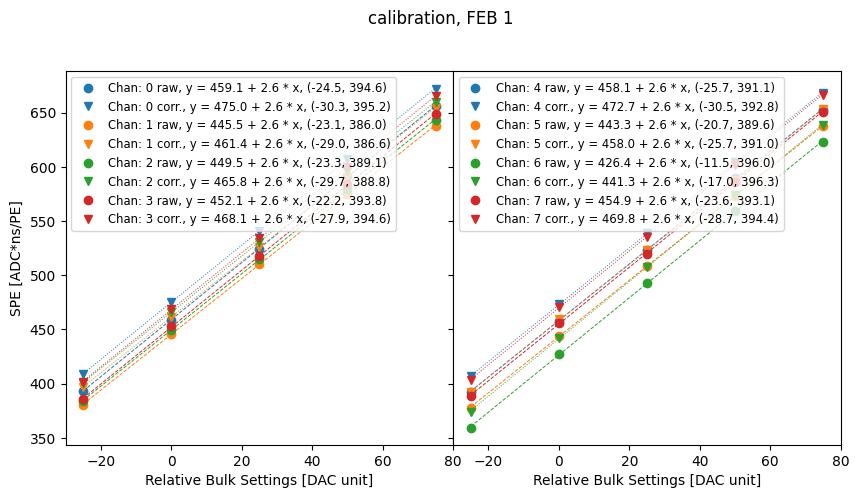

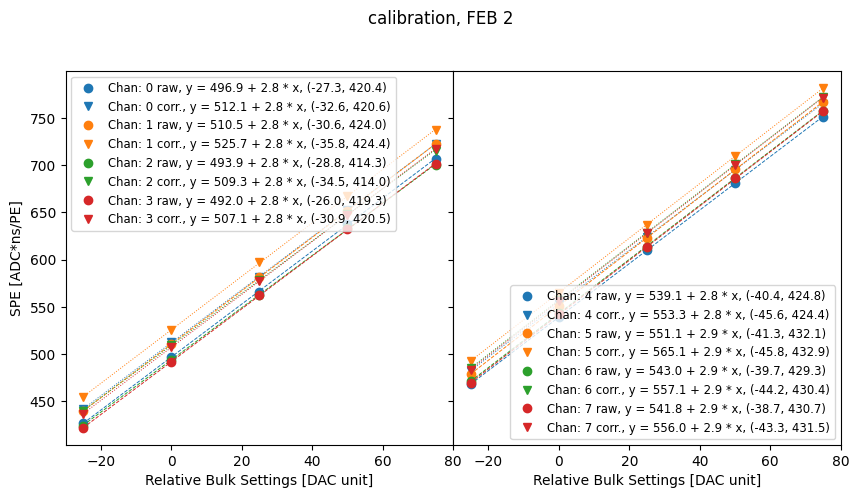

In [12]:
df2 = PortToDF(fileList2, filepath.datatag["bulk_scan_crvaging011_0"]["bulk"])
df2 = df2.query("FEB!=0").reset_index() # quad counters needs to use a different gain. remove here.
df_calib2 = CalibrateByScan(df2, TARGET_OVERVOLTAGE, 1, 2)
display(df_calib2)

In [13]:
initial_setings_files = ["Settings_crvaging-008_FEB0_sync402.txt",
                         "Settings_crvaging-008_FEB3_sync402.txt",
                         "Settings_crvaging-008_FEB0_sync402.txt"]

UpdateSettings(initial_setings_files, None, df_calib2, True, 0x01)

FEB1
before change
BULK| TRIM                           |GAIN
----+--------------------------------+----
A78 |67D 6C7 665 685 6A8 6A0 6E8 697 |384
A98 |934 922 8F1 905 932 928 933 93C |384
A75 |662 623 5FF 5FF 60E 626 5F9 62E |384
A72 |73C 71D 73A 72B 771 761 73F 70B |384
A83 |79B 788 776 7B0 7B9 7AF 7B6 79C |384
A6C |71A 760 70B 733 737 725 728 730 |384
A80 |865 84B 84B 85C 856 856 867 842 |384
A80 |6DA 6AF 677 6BC 6E6 6B5 6E5 6C7 |384
after change
BULK| TRIM                           |GAIN
----+--------------------------------+----
A80 |7FC 839 7DE 7EC 829 7F1 7E2 806 |384
A7B |812 800 7CF 7E3 810 806 811 81A |384
AA5 |842 803 7DF 7DF 7EE 806 7D9 80E |384
A86 |804 7E5 802 7F3 839 829 807 7D3 |384
A8D |7FF 7EC 7DA 814 81D 813 81A 800 |384
A81 |7EC 832 7DD 805 809 7F7 7FA 802 |384
A77 |80B 7F1 7F1 802 7FC 7FC 80D 7E8 |384
AA0 |81A 7EF 7B7 7FC 826 7F5 825 807 |384
wr 44 a80
wr 30 7fc
wr 31 839
wr 32 7de
wr 33 7ec
wr 34 829
wr 35 7f1
wr 36 7e2
wr 37 806
wr 46 384
FEB2
before change
BULK|

In [14]:
calibfileList = filepath.getfilelist([1715,1716,1717,1718,1719],"caliPDF",5)[0]
print(calibfileList)

['/pnfs/mu2e/persistent/datasets/phy-etc/etc/mu2e/CRV_wideband_cosmics_cali/CRVWB-000-005-000/pdf/11/ec/etc.mu2e.CRV_wideband_cosmics_cali.CRVWB-000-005-000.001715_000.pdf', '/pnfs/mu2e/persistent/datasets/phy-etc/etc/mu2e/CRV_wideband_cosmics_cali/CRVWB-000-005-000/pdf/e7/a8/etc.mu2e.CRV_wideband_cosmics_cali.CRVWB-000-005-000.001716_000.pdf', '/pnfs/mu2e/persistent/datasets/phy-etc/etc/mu2e/CRV_wideband_cosmics_cali/CRVWB-000-005-000/pdf/f7/8c/etc.mu2e.CRV_wideband_cosmics_cali.CRVWB-000-005-000.001717_000.pdf', '/pnfs/mu2e/persistent/datasets/phy-etc/etc/mu2e/CRV_wideband_cosmics_cali/CRVWB-000-005-000/pdf/be/06/etc.mu2e.CRV_wideband_cosmics_cali.CRVWB-000-005-000.001718_000.pdf', '/pnfs/mu2e/persistent/datasets/phy-etc/etc/mu2e/CRV_wideband_cosmics_cali/CRVWB-000-005-000/pdf/ba/75/etc.mu2e.CRV_wideband_cosmics_cali.CRVWB-000-005-000.001719_000.pdf']


,FEB,ch,bulkRelativeSettingRaw,SPErefRaw
0,0,0,17.2,427.805457
1,0,1,20.8,438.681702
2,0,2,20.4,441.239555
3,0,3,21.8,442.547843
4,0,4,22.6,432.523281
5,0,5,23.5,434.384548
6,0,6,19.2,440.435917
7,0,7,16.9,431.742110


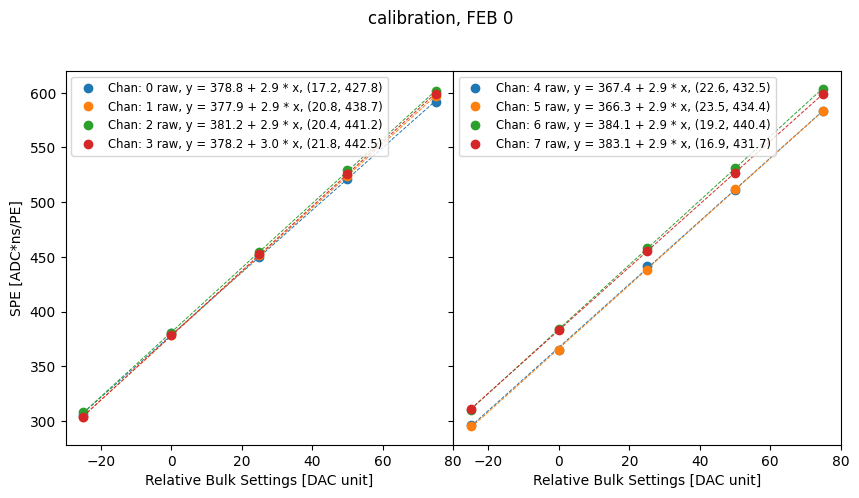

In [15]:
df3 = PortToDF(fileList3, filepath.datatag["bulk_scan_crvaging011_0"]["bulk"])
# print(df3.to_string())
df_calib3 = CalibrateByScan(df3, TARGET_OVERVOLTAGE, 1, 2, False) # rest of the channels are very bad fits.
display(df_calib3)

In [16]:
initial_setings_files = ["Settings_crvaging-008_FEB0_sync402.txt"]

UpdateSettings(initial_setings_files, None, df_calib3, False, 0x01)

FEB0
before change
BULK| TRIM                           |GAIN
----+--------------------------------+----
A78 |7E7 7CC 7C5 7ED 7E6 7F6 7D1 7E5 |384
A98 |9C9 9AE 9DB 9F2 A03 9F5 A17 A05 |384
A75 |75C 7D0 7BF 7E4 7F5 7E9 7C7 7E0 |384
A72 |7D1 7BE 79E 7D4 7E2 7A7 7AD 7DF |384
A83 |8CC 8CC 8E7 8C9 8CD 8C9 8D6 8BE |384
A6C |890 8A9 89D 898 883 896 89F 8A2 |384
A80 |831 823 86F 860 815 852 86F 86C |384
A80 |8AA 877 8AC 8C4 897 8B0 89C 888 |384
after change
BULK| TRIM                           |GAIN
----+--------------------------------+----
A90 |82B 7EC 7E9 803 7F4 7FB 801 82C |384
A67 |7DF 7C4 7F1 808 819 80B 82D 81B |384
A7A |78E 802 7F1 816 827 81B 7F9 812 |384
A78 |80D 7FA 7DA 810 81E 7E3 7E9 81B |384
A6E |7FA 7FA 815 7F7 7FB 7F7 804 7EC |384
A5D |7FA 813 807 802 7ED 800 809 80C |384
A78 |7E1 7D3 81F 810 7C5 802 81F 81C |384
A70 |80A 7D7 80C 824 7F7 810 7FC 7E8 |384
wr 44 a90
wr 30 82b
wr 31 7ec
wr 32 7e9
wr 33 803
wr 34 7f4
wr 35 7fb
wr 36 801
wr 37 82c
wr 46 384


Gain was changed to 0x680 during data taking.<br>
Above set good for 22.7 degC CMB and 41.5 degC FEB<br>
CMB temp. = 22.7 => 2.7 * 55.4 ~ 150 mV, moving to 20 degC, Vbd decrease by 150 mV, settings lower by 150 mV<br>
FEB temp. = 41.5 => 1.5 * 4    ~ 6 mV,   moving to 40 degC, same settings would see lower output, need to increase settings by 6 mV to get same output<br>
overall needs to decrease by 144 mV => decrease bulk by 0x7<br>
wr 44 a89<br>
wr 30 82b<br>
wr 31 7ec<br>
wr 32 7e9<br>
wr 33 803<br>
wr 34 7f4<br>
wr 35 7fb<br>
wr 36 801<br>
wr 37 82c<br>
wr 46 680<br>
